# Importing libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from glob import glob
import cv2
import torch
from torchvision import transforms
from mtcnn import MTCNN
import os
import torch.nn.functional as F
import pandas as pd

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Read the preprocessed dataset

In [3]:
train_path = './data/train_data/'
val_path = './data/val_data/'
test_path = './data/test_data/'

In [4]:
X_train = np.load(train_path + 'Xtrain.npy')
y_train = np.load(train_path + 'ytrain.npy')

In [5]:
X_val = np.load(val_path + 'Xval.npy')
y_val = np.load(val_path + 'yval.npy')

In [6]:
X_test = np.load(test_path + 'Xtest.npy')
y_test = np.load(test_path + 'ytest.npy')

In [7]:
y_train = y_train.astype(np.float32)
y_val = y_val.astype(np.float32)
y_test = y_test.astype(np.float32)

In [8]:
X_train = X_train.astype(np.float32)
X_val = X_val.astype(np.float32)
X_test = X_test.astype(np.float32)

In [9]:
X_train.shape, X_val.shape, X_test.shape

((12208, 224, 224, 3), (1745, 224, 224, 3), (3488, 224, 224, 3))

In [10]:
from dataset import TorchDatasetCreator
from torch.utils.data import DataLoader

In [11]:
batch_size = 32

In [12]:
# DataLoader provides the (Image, Age_label, Gender_label)
train_dataset = TorchDatasetCreator(dataset = (X_train, y_train[:, 0].reshape(-1), y_train[:, 1].reshape(-1)))
val_dataset = TorchDatasetCreator(dataset = (X_val, y_val[:, 0].reshape(-1), y_val[:, 1].reshape(-1)))
test_dataset = TorchDatasetCreator(dataset = (X_test, y_test[:, 0].reshape(-1), y_test[:, 1].reshape(-1)))

In [13]:
# Don't shuffle the data as it is already shuffled
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle = False, pin_memory = True)
val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle = False, pin_memory = True)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle = False, pin_memory = True)

In [14]:
from train import trainer, evaluate

In [15]:
from model import BaseModel

In [19]:
model_age = BaseModel().to(device)

ERROR! Session/line number was not unique in database. History logging moved to new session 4031


In [20]:
learning_rate_age = 0.000001
optimizer_age = torch.optim.Adam(model_age.parameters(), lr=learning_rate_age)
loss_fn_age = torch.nn.MSELoss()

Starting the training of task - Age prediction.

EPOCH 01/30 | batch train loss = 108.6092377 | ====================> 100.00%

Validation loss was better than before, saving weights in: Age_Model_BaseModel.pt

Average train loss = 47.782288

Validation loss = 45.719576
-----------------------------------

EPOCH 02/30 | batch train loss = 98.5354233 | ====================> 100.00%

Validation loss was better than before, saving weights in: Age_Model_BaseModel.pt

Average train loss = 44.230824

Validation loss = 41.054848
-----------------------------------

EPOCH 03/30 | batch train loss = 83.8359756 | ====================> 100.00%

Validation loss was better than before, saving weights in: Age_Model_BaseModel.pt

Average train loss = 38.759003

Validation loss = 34.547453
-----------------------------------

EPOCH 04/30 | batch train loss = 65.6763458 | ====================> 100.00%

Validation loss was better than before, saving weights in: Age_Model_BaseModel.pt

Average train loss 

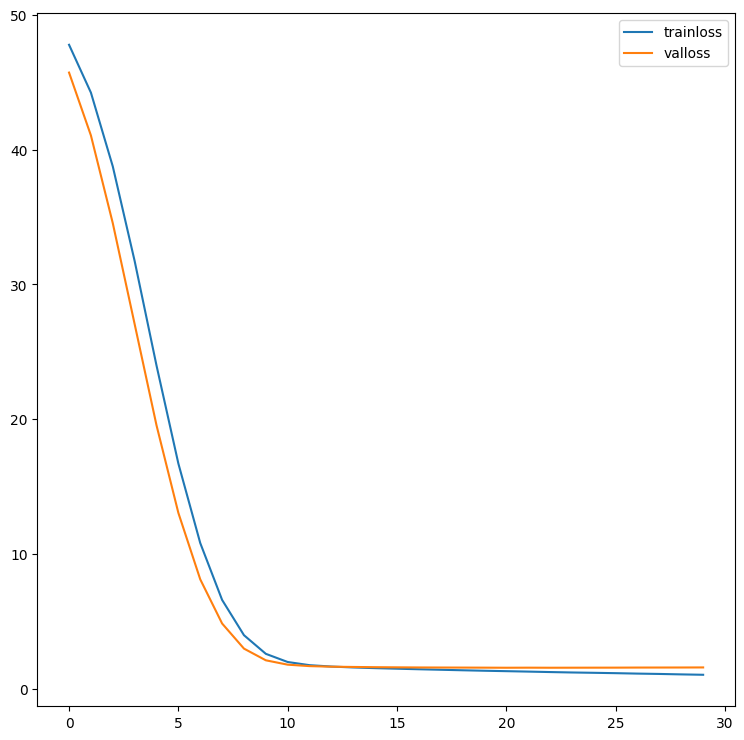

In [21]:
trainer(model_age, train_loader, val_loader, optimizer_age, loss_fn_age, task='Age', epochs=30)

In [16]:
model_age = BaseModel().to(device)
model_age.load_state_dict(torch.load('./weights/Age_Model_BaseModel_Best.pt'))

C:\Users\hrayr\anaconda3\envs\acoustic\lib\site-packages\torchvision\models\_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
C:\Users\hrayr\anaconda3\envs\acoustic\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


<All keys matched successfully>

In [17]:
from helper import age_pred_acc, calc_preds, find_worst_preds

In [18]:
# Example prediction
age_pred_acc(model_age, X_train[5], y_train[5,0])

--------------------------------------------------
Prediction of the age = 59.68
The real age = 55.0
--------------------------------------------------
The error = 4.68
The accuracy of the prediction based on the acceptable error(5) is 1
--------------------------------------------------


1

In [27]:
# Calculate all predictions for train data
age_predictions_train = calc_preds(model_age, X_train, y_train)

In [28]:
# Calculate all predictions for test data
age_predictions_test = calc_preds(model_age, X_test, y_test)

In [37]:
# Calculate all predictions for validation data
age_predictions_val = calc_preds(model_age, X_val, y_val)

In [29]:
def map_value_to_group(label):
    """
    Mapping the real label to the acceptable maximum error
    For example, if the true label is 1, the acceptable maximum error is 1 year. So, the range becomes [0, 2].
    In other words, if the prediction is 1.8, then it is correct, if it is 2.2, then incorrect.
    
    """
    if 0 <= label < 2:
        return 1
    elif 2 <= label < 5:
        return 2
    elif 5 <= label < 10:
        return 3
    elif 10 <= label < 20:
        return 4
    elif 20 <= label < 40:
        return 5
    elif 40 <= label < 60:
        return 7
    elif 60 <= label < 70:
        return 10
    elif 70 <= label < 80:
        return 12
    elif 80 <= label < 90: 
        return 15  
    elif 90 <= label < 100:
        return 17
    elif 100 <= label <= 120:  
        return 20
    else:
        return 25

In [30]:
def calc_accuracy_age(predictions, max_error=10):
    """
    Calculates the accuracy of the prediction when the absolute difference of the prediction and 
    correct label is less than the maximum error.
    """
    errors_list = [error[-1] for error in predictions]
    within_range = [1 if predictions[i][-1] <= map_value_to_group(predictions[i][0]) else 0 for i in range(len(predictions))]
    return np.sum(within_range)/len(errors_list)

In [31]:
print('The accuracy for the age of train dataset =', calc_accuracy_age(age_predictions_train))

The accuracy for the age of train dataset = 0.7083060288335518


In [32]:
print('The accuracy for the age of test dataset =', calc_accuracy_age(age_predictions_test))

The accuracy for the age of test dataset = 0.6318807339449541


In [38]:
print('The accuracy for the age of validation dataset =', calc_accuracy_age(age_predictions_val))

The accuracy for the age of validation dataset = 0.633810888252149


In [44]:
def calc_mse(predictions):
    "Calculate the MSE for the predictions"
    mse = [v[-1] for v in predictions]
    return np.array(mse).mean()

In [45]:
print('The MSE for the age of train dataset =', calc_mse(age_predictions_train))

The MSE for the age of train dataset = 4.221807722964106


In [46]:
print('The MSE for the age of test dataset =', calc_mse(age_predictions_test))

The MSE for the age of test dataset = 5.179715593029326


In [47]:
print('The MSE for the age of validation dataset =', calc_mse(age_predictions_val))

The MSE for the age of validation dataset = 5.238464393451768


In [33]:
# Worst preds
highest_error_idx_test = find_worst_preds(age_predictions_test)

In [34]:
n_worst = 100

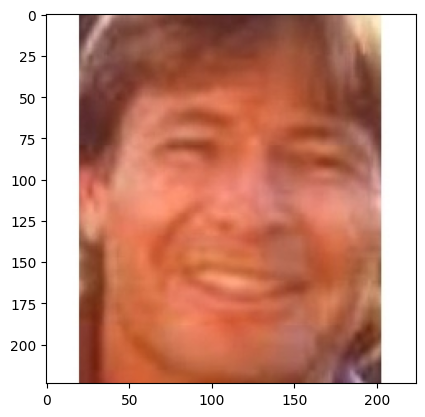



--------------------------------------------------
Correct label = 26.0
Predicted label = 61.17792510986328
Error = 35.17792510986328
--------------------------------------------------


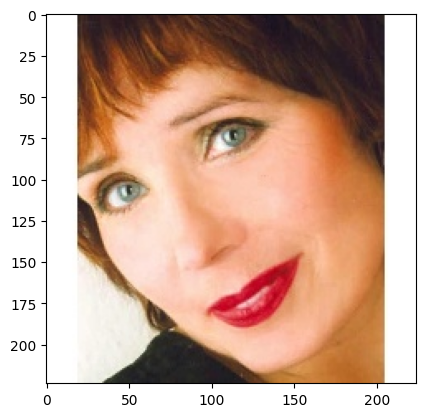



--------------------------------------------------
Correct label = 60.0
Predicted label = 27.13772201538086
Error = 32.86227798461914
--------------------------------------------------


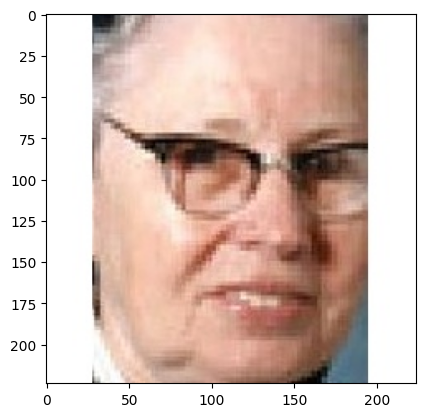



--------------------------------------------------
Correct label = 84.0
Predicted label = 57.27973175048828
Error = 26.72026824951172
--------------------------------------------------


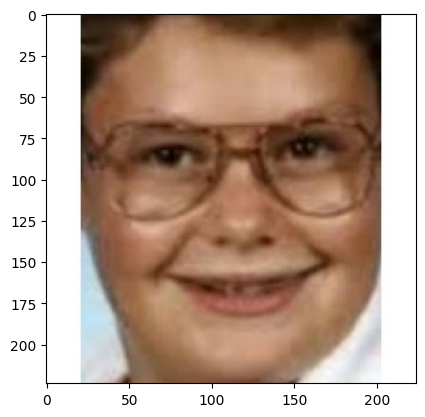



--------------------------------------------------
Correct label = 25.0
Predicted label = 51.713687896728516
Error = 26.713687896728516
--------------------------------------------------


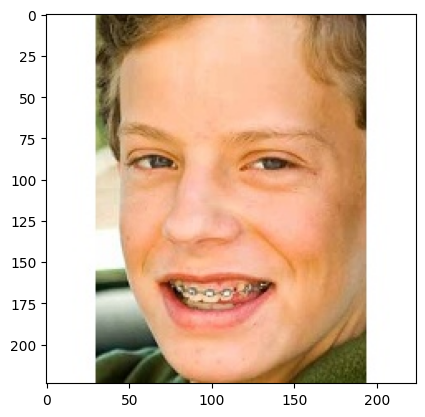



--------------------------------------------------
Correct label = 16.0
Predicted label = 41.44840621948242
Error = 25.448406219482422
--------------------------------------------------


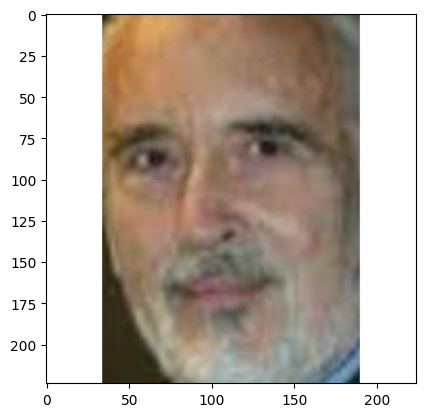



--------------------------------------------------
Correct label = 75.0
Predicted label = 50.52489471435547
Error = 24.47510528564453
--------------------------------------------------


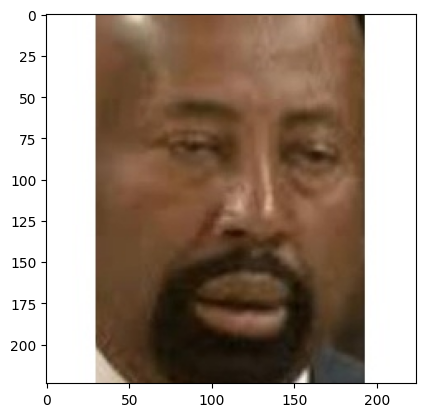



--------------------------------------------------
Correct label = 37.0
Predicted label = 61.13912582397461
Error = 24.13912582397461
--------------------------------------------------


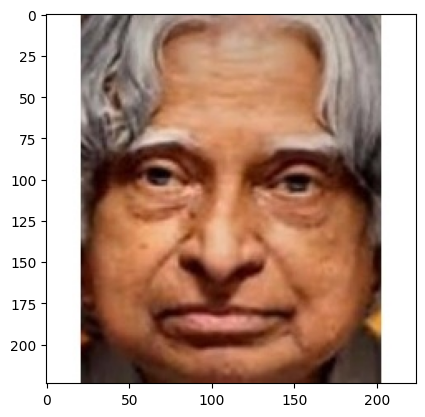



--------------------------------------------------
Correct label = 50.0
Predicted label = 74.10353088378906
Error = 24.103530883789062
--------------------------------------------------


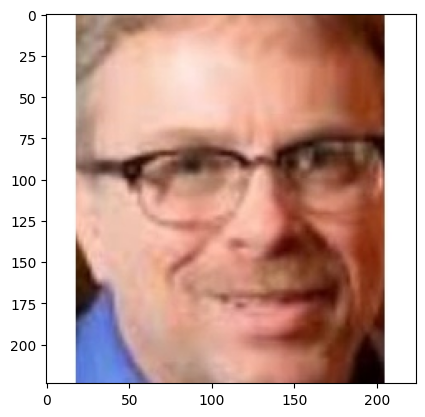



--------------------------------------------------
Correct label = 70.0
Predicted label = 46.195064544677734
Error = 23.804935455322266
--------------------------------------------------


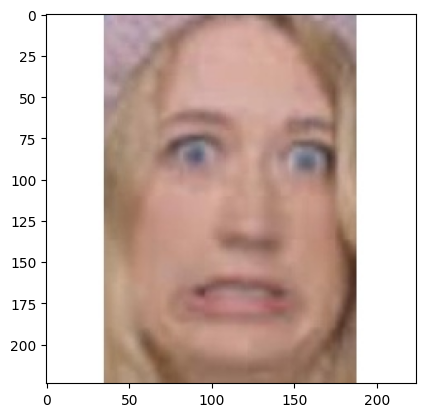



--------------------------------------------------
Correct label = 26.0
Predicted label = 49.577938079833984
Error = 23.577938079833984
--------------------------------------------------


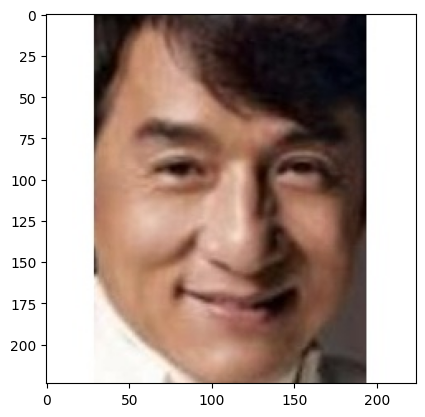



--------------------------------------------------
Correct label = 59.0
Predicted label = 35.63019561767578
Error = 23.36980438232422
--------------------------------------------------


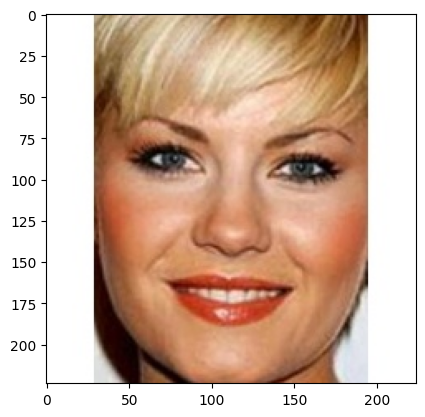



--------------------------------------------------
Correct label = 26.0
Predicted label = 49.28299331665039
Error = 23.28299331665039
--------------------------------------------------


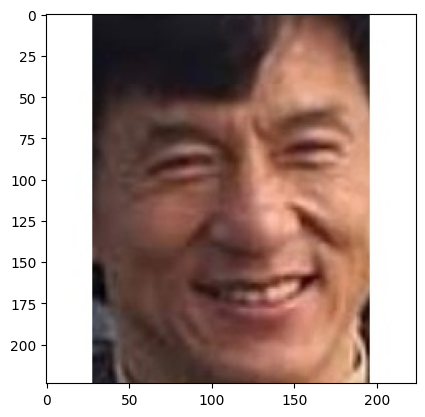



--------------------------------------------------
Correct label = 35.0
Predicted label = 58.19916915893555
Error = 23.199169158935547
--------------------------------------------------


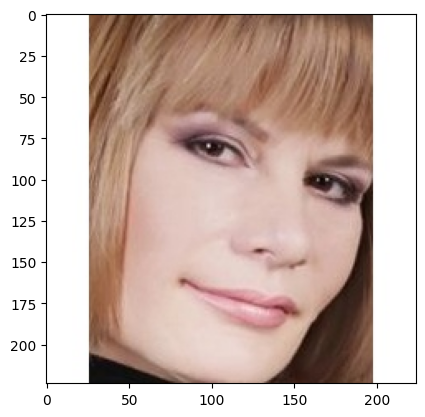



--------------------------------------------------
Correct label = 51.0
Predicted label = 27.977144241333008
Error = 23.022855758666992
--------------------------------------------------


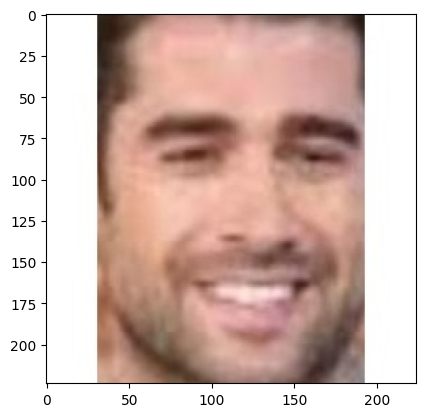



--------------------------------------------------
Correct label = 57.0
Predicted label = 34.0286750793457
Error = 22.971324920654297
--------------------------------------------------


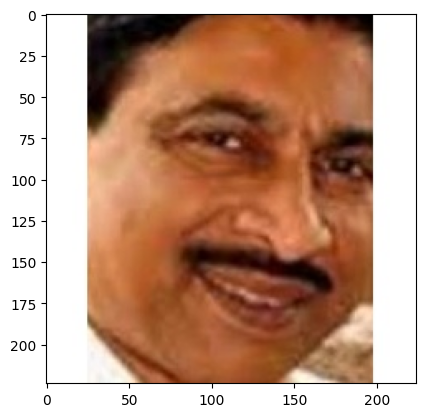



--------------------------------------------------
Correct label = 36.0
Predicted label = 58.903587341308594
Error = 22.903587341308594
--------------------------------------------------


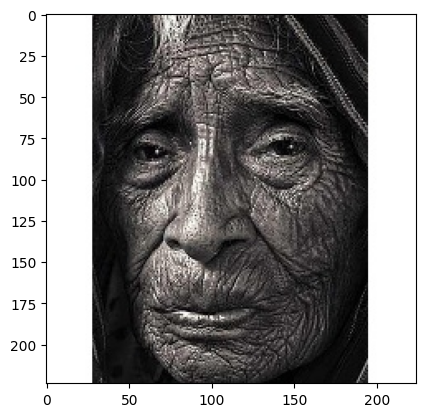



--------------------------------------------------
Correct label = 110.0
Predicted label = 87.18008422851562
Error = 22.819915771484375
--------------------------------------------------


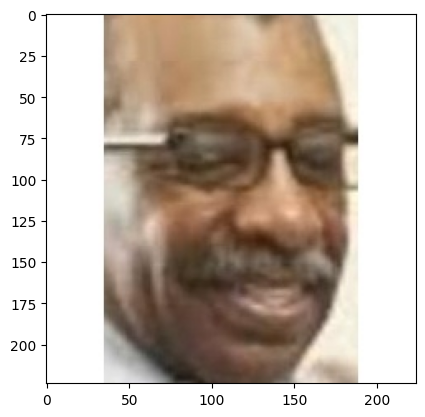



--------------------------------------------------
Correct label = 71.0
Predicted label = 48.24314880371094
Error = 22.756851196289062
--------------------------------------------------


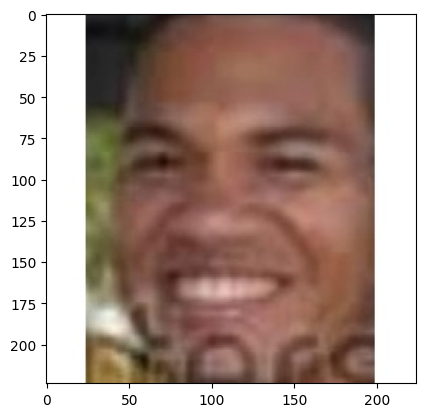



--------------------------------------------------
Correct label = 26.0
Predicted label = 48.15304946899414
Error = 22.15304946899414
--------------------------------------------------


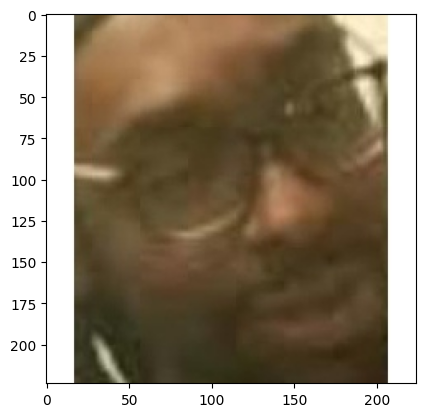



--------------------------------------------------
Correct label = 26.0
Predicted label = 48.07554244995117
Error = 22.075542449951172
--------------------------------------------------


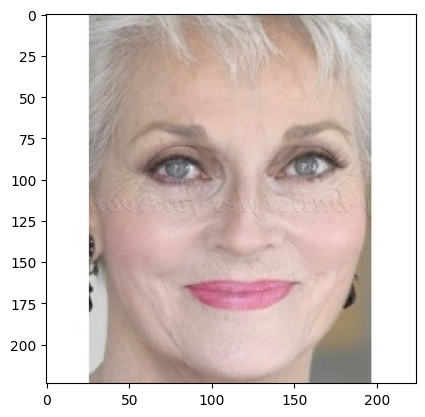



--------------------------------------------------
Correct label = 60.0
Predicted label = 81.88956451416016
Error = 21.889564514160156
--------------------------------------------------


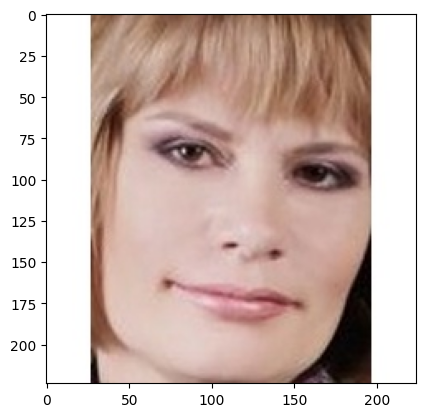



--------------------------------------------------
Correct label = 51.0
Predicted label = 29.28145980834961
Error = 21.71854019165039
--------------------------------------------------


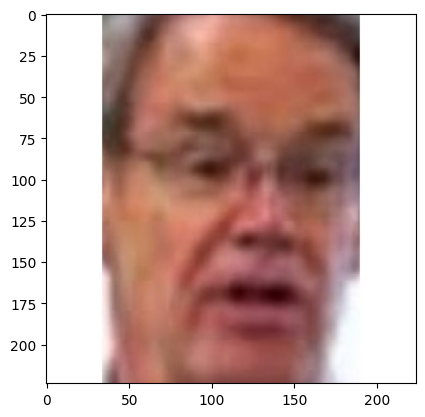



--------------------------------------------------
Correct label = 78.0
Predicted label = 56.50900650024414
Error = 21.49099349975586
--------------------------------------------------


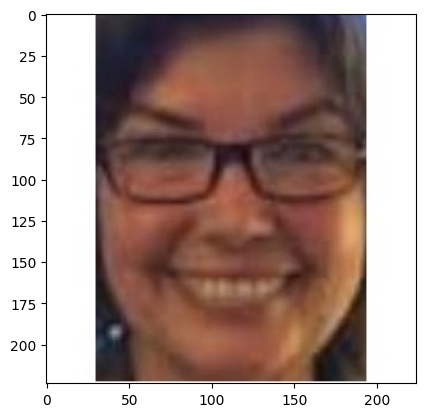



--------------------------------------------------
Correct label = 54.0
Predicted label = 32.58504104614258
Error = 21.414958953857422
--------------------------------------------------


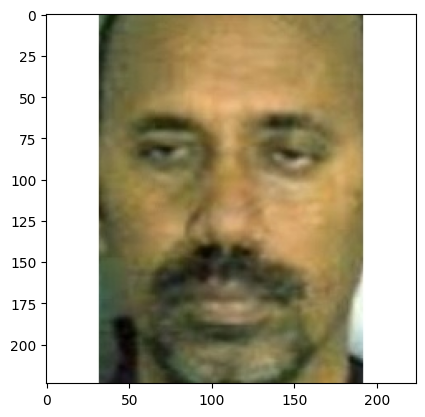



--------------------------------------------------
Correct label = 67.0
Predicted label = 45.6916618347168
Error = 21.308338165283203
--------------------------------------------------


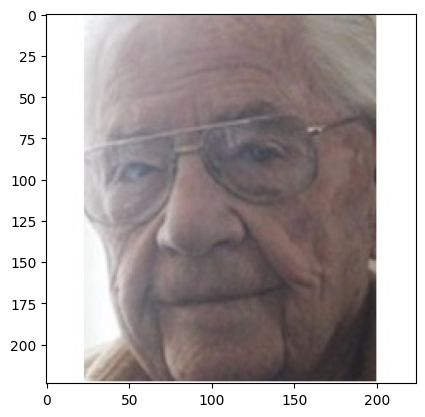



--------------------------------------------------
Correct label = 80.0
Predicted label = 100.92123413085938
Error = 20.921234130859375
--------------------------------------------------


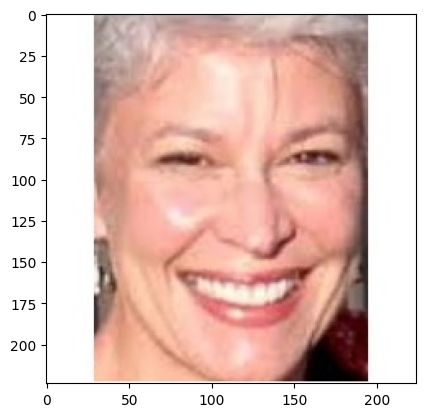



--------------------------------------------------
Correct label = 49.0
Predicted label = 69.8330307006836
Error = 20.833030700683594
--------------------------------------------------


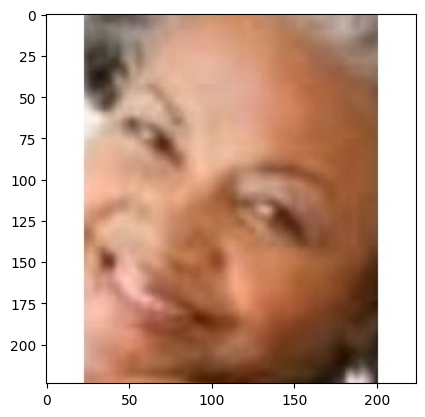



--------------------------------------------------
Correct label = 68.0
Predicted label = 47.26276397705078
Error = 20.73723602294922
--------------------------------------------------


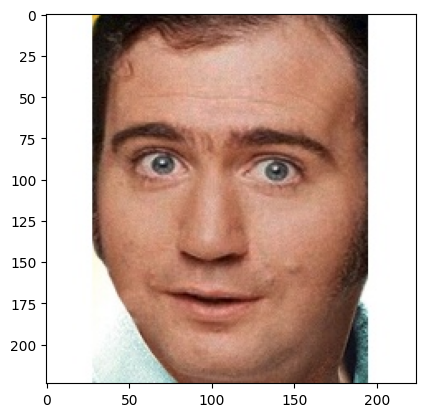



--------------------------------------------------
Correct label = 54.0
Predicted label = 33.364437103271484
Error = 20.635562896728516
--------------------------------------------------


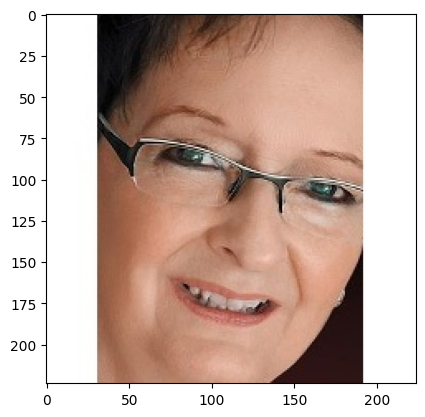



--------------------------------------------------
Correct label = 60.0
Predicted label = 39.582279205322266
Error = 20.417720794677734
--------------------------------------------------


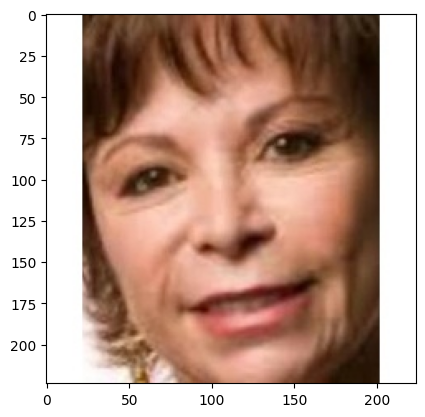



--------------------------------------------------
Correct label = 35.0
Predicted label = 55.298065185546875
Error = 20.298065185546875
--------------------------------------------------


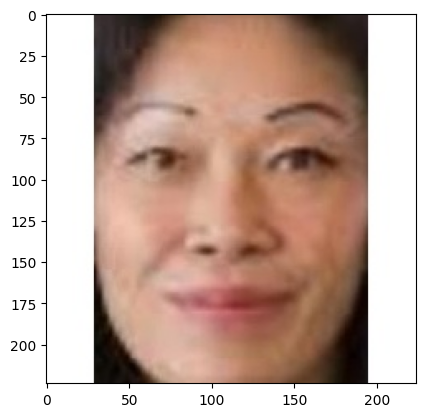



--------------------------------------------------
Correct label = 55.0
Predicted label = 34.77898025512695
Error = 20.221019744873047
--------------------------------------------------


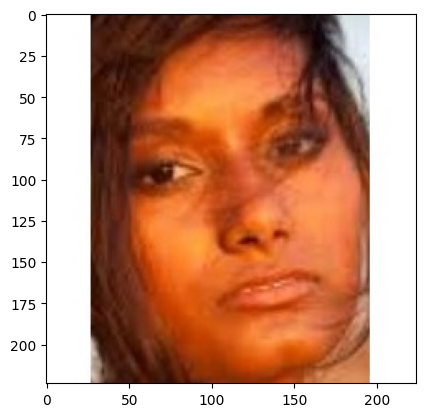



--------------------------------------------------
Correct label = 23.0
Predicted label = 43.05849838256836
Error = 20.05849838256836
--------------------------------------------------


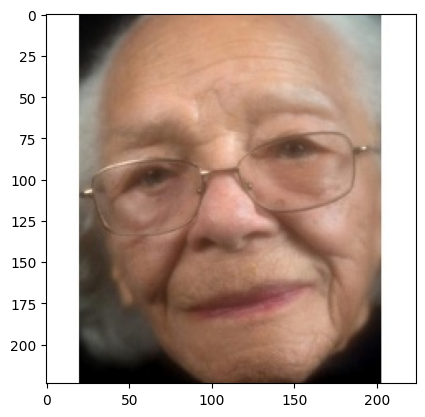



--------------------------------------------------
Correct label = 100.0
Predicted label = 79.96015930175781
Error = 20.039840698242188
--------------------------------------------------


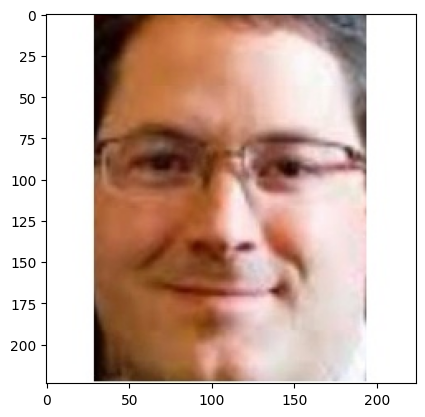



--------------------------------------------------
Correct label = 54.0
Predicted label = 34.234867095947266
Error = 19.765132904052734
--------------------------------------------------


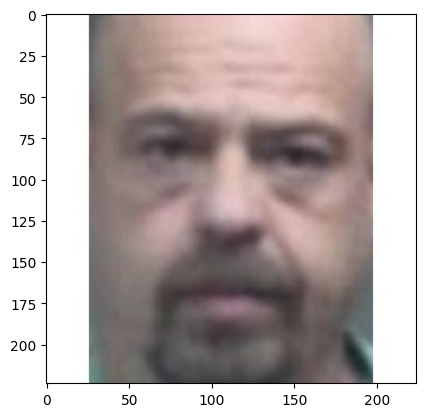



--------------------------------------------------
Correct label = 43.0
Predicted label = 62.52492904663086
Error = 19.52492904663086
--------------------------------------------------


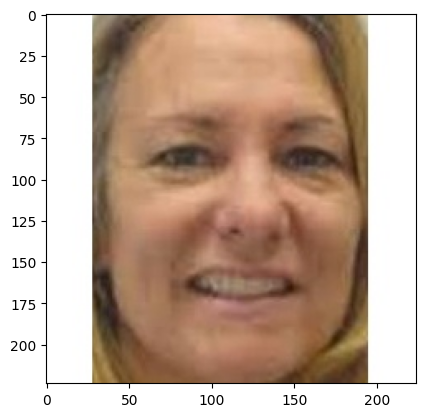



--------------------------------------------------
Correct label = 38.0
Predicted label = 57.49477767944336
Error = 19.49477767944336
--------------------------------------------------


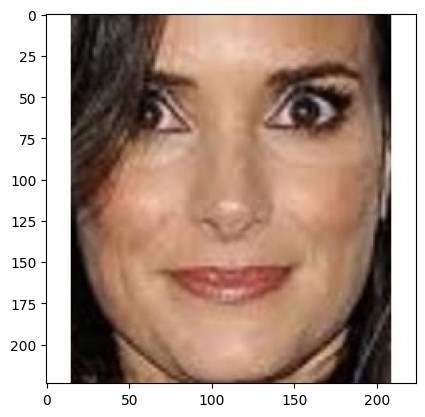



--------------------------------------------------
Correct label = 32.0
Predicted label = 51.43988800048828
Error = 19.43988800048828
--------------------------------------------------


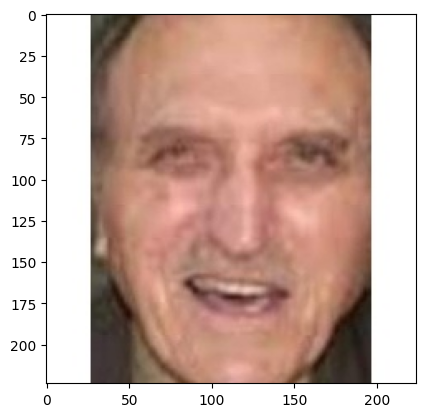



--------------------------------------------------
Correct label = 80.0
Predicted label = 60.5914192199707
Error = 19.408580780029297
--------------------------------------------------


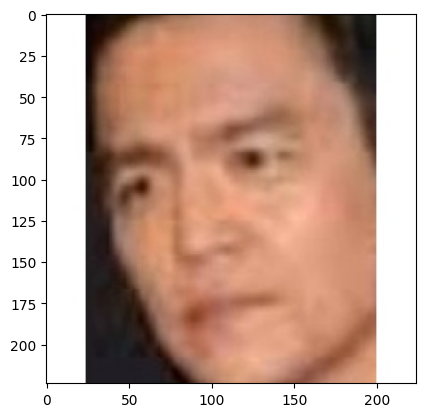



--------------------------------------------------
Correct label = 26.0
Predicted label = 45.400753021240234
Error = 19.400753021240234
--------------------------------------------------


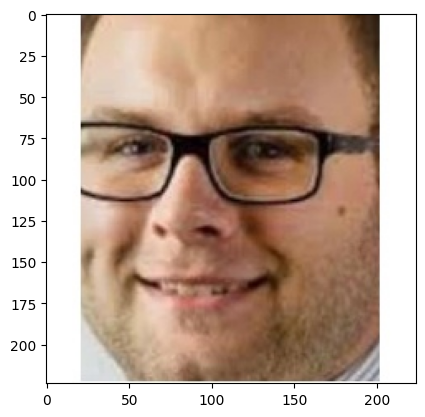



--------------------------------------------------
Correct label = 46.0
Predicted label = 26.755952835083008
Error = 19.244047164916992
--------------------------------------------------


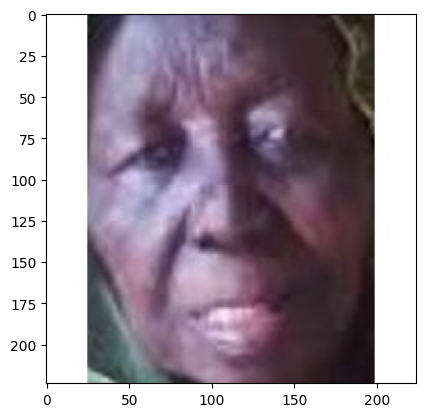



--------------------------------------------------
Correct label = 60.0
Predicted label = 79.21452331542969
Error = 19.214523315429688
--------------------------------------------------


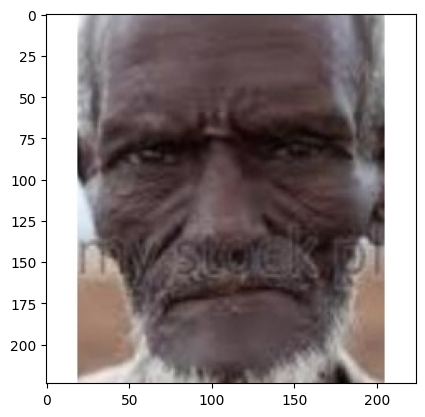



--------------------------------------------------
Correct label = 63.0
Predicted label = 82.1448974609375
Error = 19.1448974609375
--------------------------------------------------


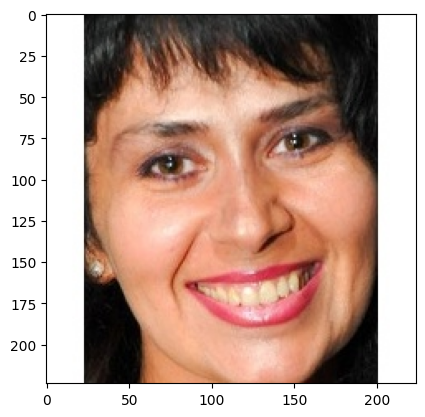



--------------------------------------------------
Correct label = 52.0
Predicted label = 32.963008880615234
Error = 19.036991119384766
--------------------------------------------------


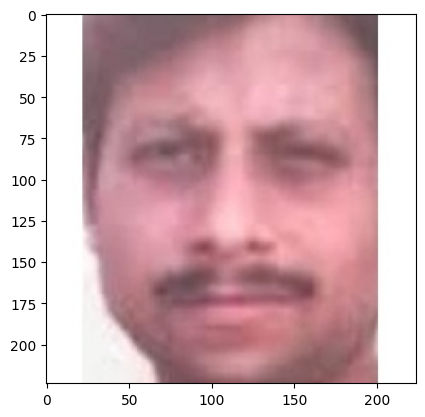



--------------------------------------------------
Correct label = 25.0
Predicted label = 43.96467971801758
Error = 18.964679718017578
--------------------------------------------------


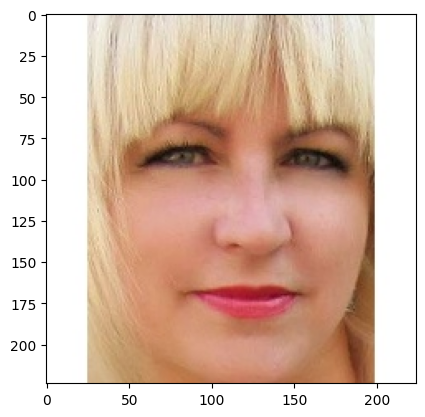



--------------------------------------------------
Correct label = 56.0
Predicted label = 37.05416488647461
Error = 18.94583511352539
--------------------------------------------------


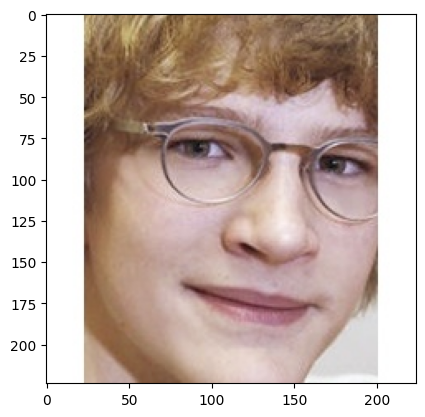



--------------------------------------------------
Correct label = 16.0
Predicted label = 34.93745803833008
Error = 18.937458038330078
--------------------------------------------------


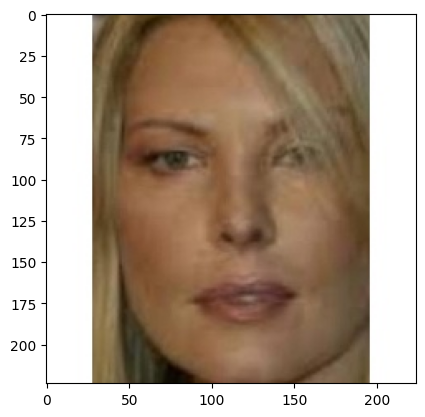



--------------------------------------------------
Correct label = 25.0
Predicted label = 43.90633773803711
Error = 18.90633773803711
--------------------------------------------------


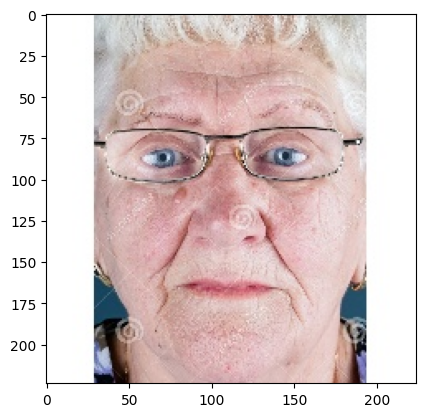



--------------------------------------------------
Correct label = 85.0
Predicted label = 66.10089111328125
Error = 18.89910888671875
--------------------------------------------------


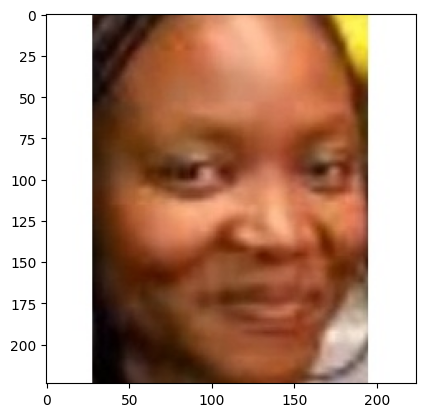



--------------------------------------------------
Correct label = 26.0
Predicted label = 44.84543991088867
Error = 18.845439910888672
--------------------------------------------------


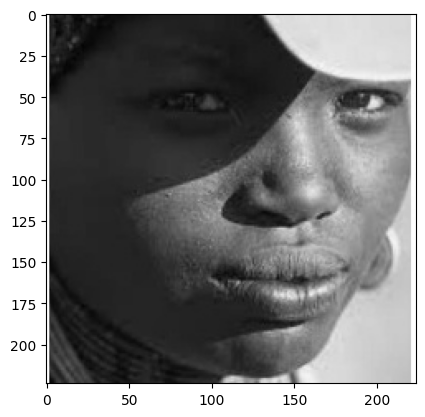



--------------------------------------------------
Correct label = 35.0
Predicted label = 16.245532989501953
Error = 18.754467010498047
--------------------------------------------------


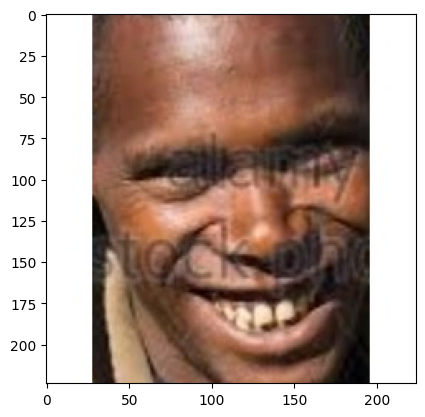



--------------------------------------------------
Correct label = 23.0
Predicted label = 41.75123977661133
Error = 18.751239776611328
--------------------------------------------------


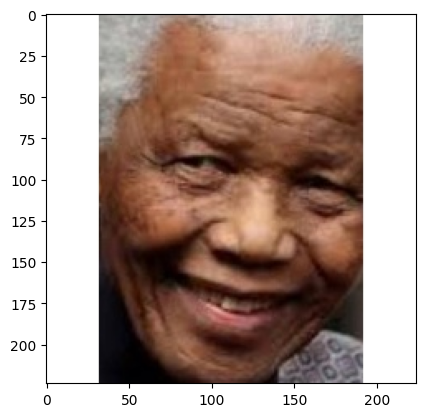



--------------------------------------------------
Correct label = 67.0
Predicted label = 85.73628997802734
Error = 18.736289978027344
--------------------------------------------------


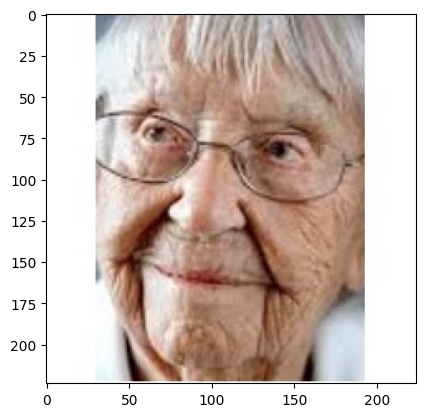



--------------------------------------------------
Correct label = 84.0
Predicted label = 102.68485260009766
Error = 18.684852600097656
--------------------------------------------------


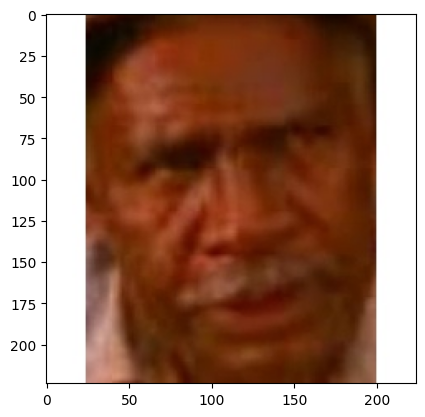



--------------------------------------------------
Correct label = 76.0
Predicted label = 57.32817840576172
Error = 18.67182159423828
--------------------------------------------------


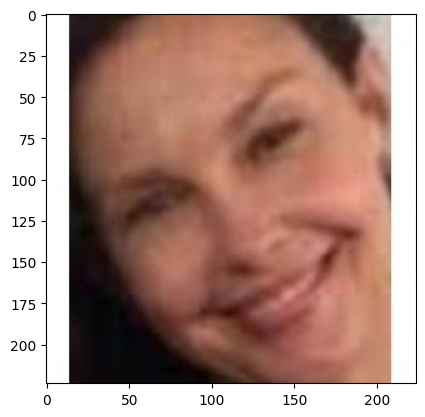



--------------------------------------------------
Correct label = 54.0
Predicted label = 35.342315673828125
Error = 18.657684326171875
--------------------------------------------------


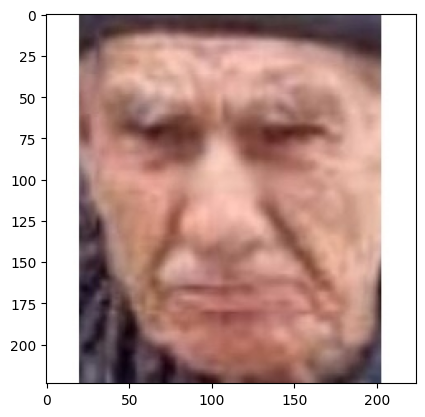



--------------------------------------------------
Correct label = 85.0
Predicted label = 66.35543823242188
Error = 18.644561767578125
--------------------------------------------------


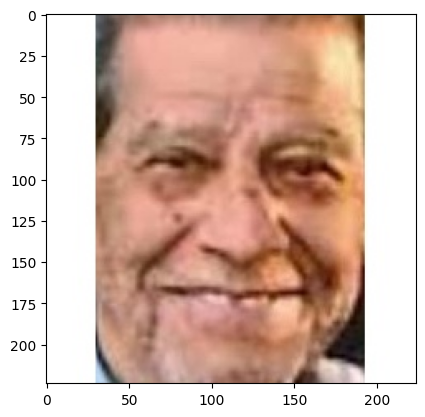



--------------------------------------------------
Correct label = 90.0
Predicted label = 71.40472412109375
Error = 18.59527587890625
--------------------------------------------------


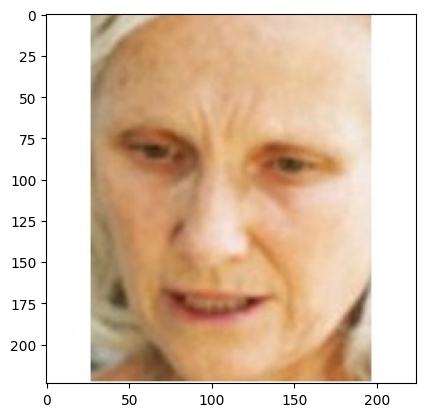



--------------------------------------------------
Correct label = 80.0
Predicted label = 61.4566535949707
Error = 18.543346405029297
--------------------------------------------------


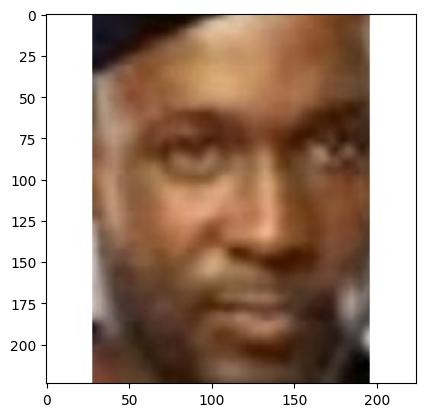



--------------------------------------------------
Correct label = 54.0
Predicted label = 35.58317947387695
Error = 18.416820526123047
--------------------------------------------------


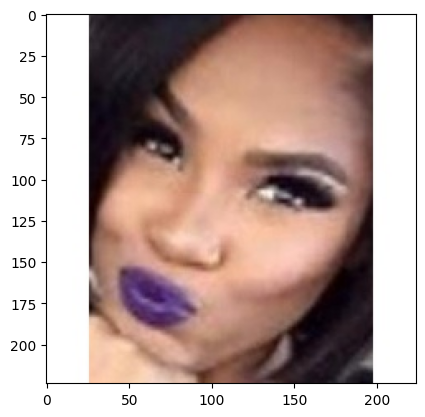



--------------------------------------------------
Correct label = 42.0
Predicted label = 23.639738082885742
Error = 18.360261917114258
--------------------------------------------------


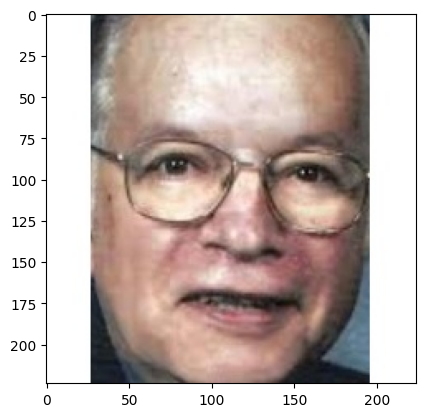



--------------------------------------------------
Correct label = 80.0
Predicted label = 61.734737396240234
Error = 18.265262603759766
--------------------------------------------------


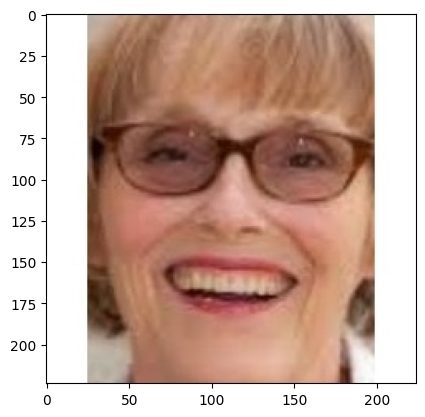



--------------------------------------------------
Correct label = 55.0
Predicted label = 73.22276306152344
Error = 18.222763061523438
--------------------------------------------------


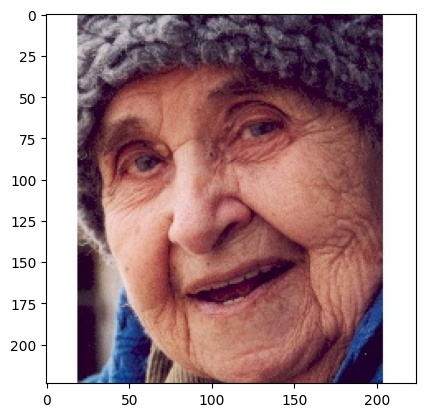



--------------------------------------------------
Correct label = 90.0
Predicted label = 107.97742462158203
Error = 17.97742462158203
--------------------------------------------------


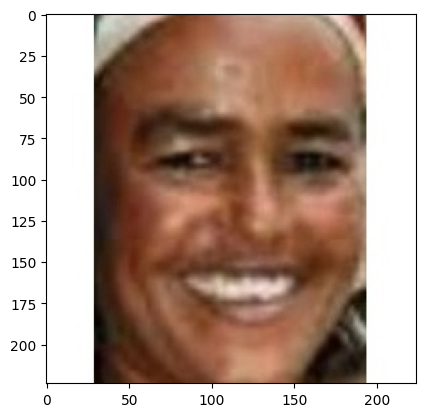



--------------------------------------------------
Correct label = 56.0
Predicted label = 38.06081771850586
Error = 17.93918228149414
--------------------------------------------------


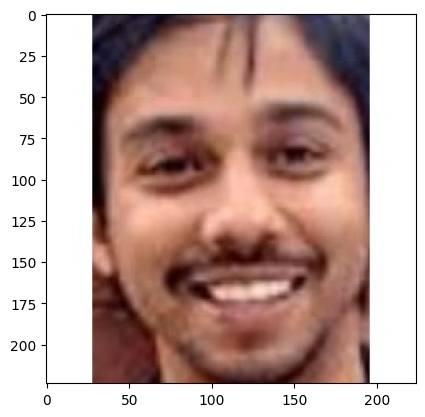



--------------------------------------------------
Correct label = 40.0
Predicted label = 22.10755729675293
Error = 17.89244270324707
--------------------------------------------------


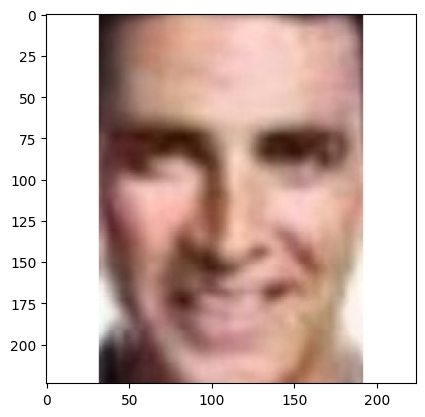



--------------------------------------------------
Correct label = 26.0
Predicted label = 43.88203048706055
Error = 17.882030487060547
--------------------------------------------------


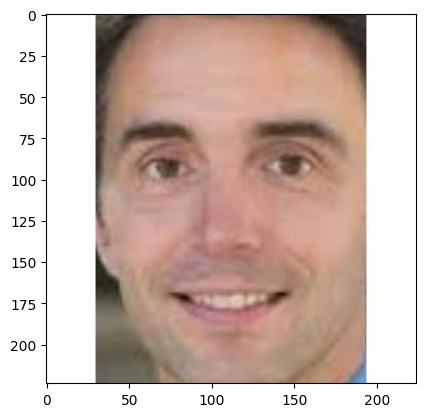



--------------------------------------------------
Correct label = 51.0
Predicted label = 33.14531326293945
Error = 17.854686737060547
--------------------------------------------------


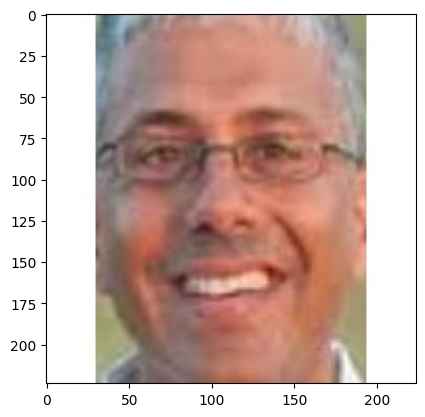



--------------------------------------------------
Correct label = 40.0
Predicted label = 57.67203140258789
Error = 17.67203140258789
--------------------------------------------------


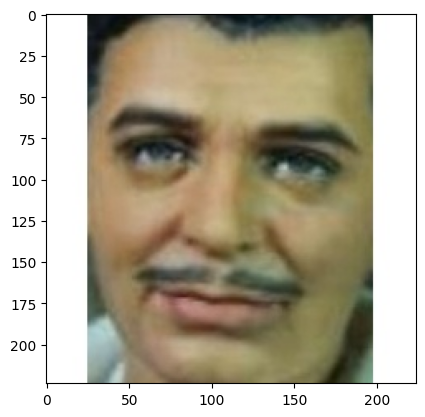



--------------------------------------------------
Correct label = 50.0
Predicted label = 32.431949615478516
Error = 17.568050384521484
--------------------------------------------------


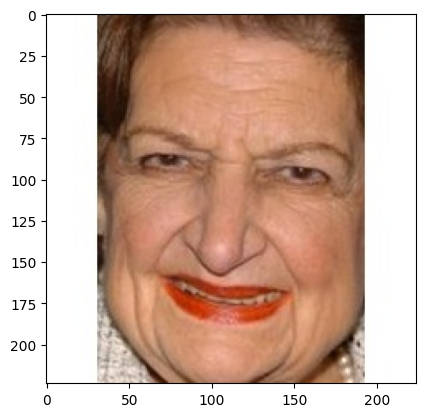



--------------------------------------------------
Correct label = 88.0
Predicted label = 70.44486999511719
Error = 17.555130004882812
--------------------------------------------------


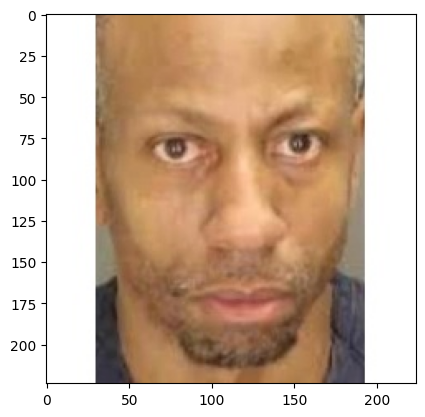



--------------------------------------------------
Correct label = 55.0
Predicted label = 37.506832122802734
Error = 17.493167877197266
--------------------------------------------------


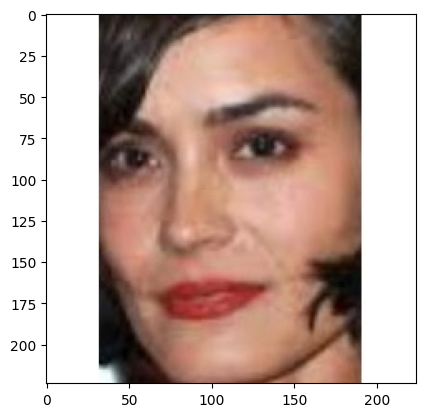



--------------------------------------------------
Correct label = 28.0
Predicted label = 45.371761322021484
Error = 17.371761322021484
--------------------------------------------------


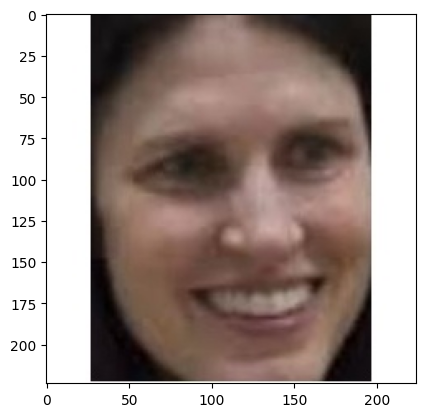



--------------------------------------------------
Correct label = 44.0
Predicted label = 26.669187545776367
Error = 17.330812454223633
--------------------------------------------------


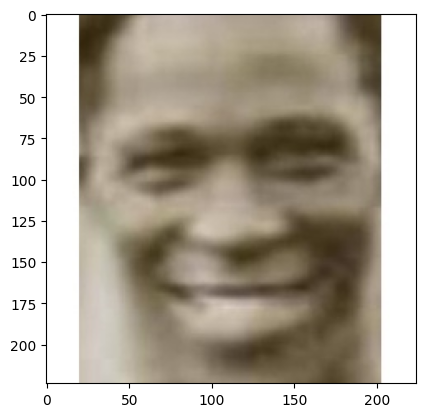



--------------------------------------------------
Correct label = 24.0
Predicted label = 41.24338912963867
Error = 17.243389129638672
--------------------------------------------------


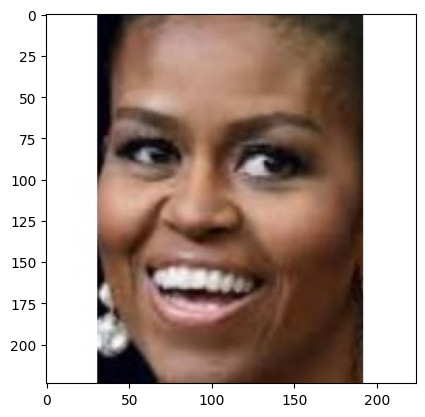



--------------------------------------------------
Correct label = 50.0
Predicted label = 32.7898063659668
Error = 17.210193634033203
--------------------------------------------------


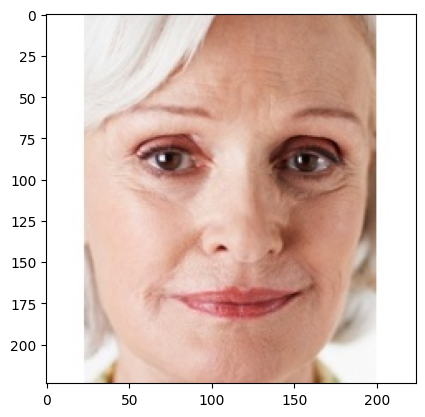



--------------------------------------------------
Correct label = 68.0
Predicted label = 50.822303771972656
Error = 17.177696228027344
--------------------------------------------------


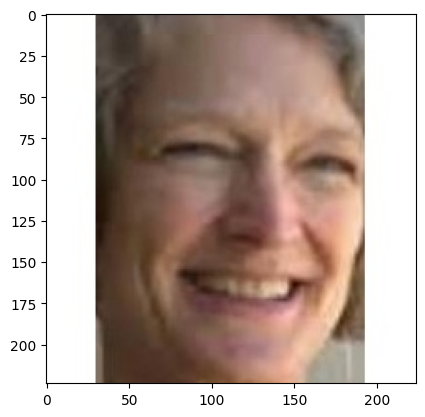



--------------------------------------------------
Correct label = 70.0
Predicted label = 52.92258071899414
Error = 17.07741928100586
--------------------------------------------------


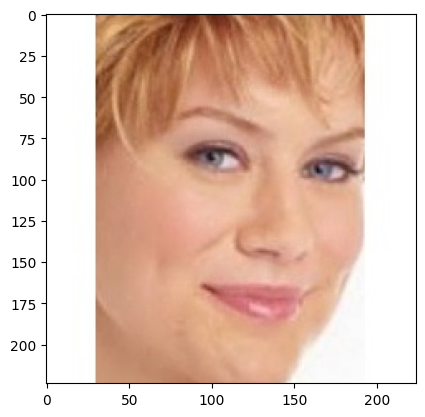



--------------------------------------------------
Correct label = 45.0
Predicted label = 27.996273040771484
Error = 17.003726959228516
--------------------------------------------------


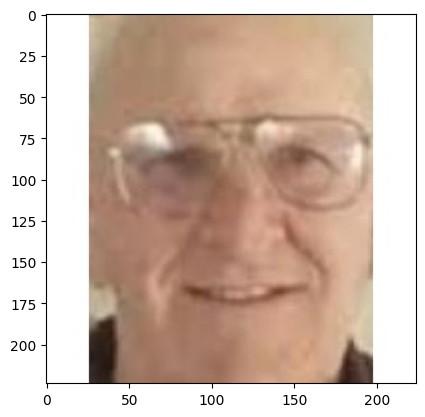



--------------------------------------------------
Correct label = 90.0
Predicted label = 73.02828979492188
Error = 16.971710205078125
--------------------------------------------------


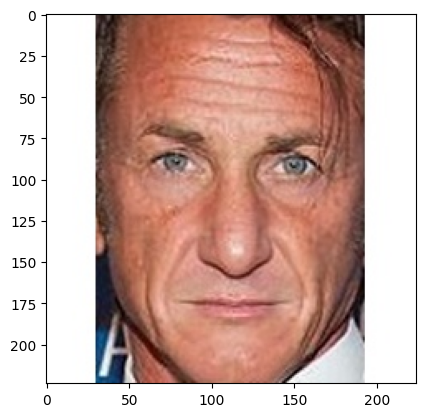



--------------------------------------------------
Correct label = 53.0
Predicted label = 69.92988586425781
Error = 16.929885864257812
--------------------------------------------------


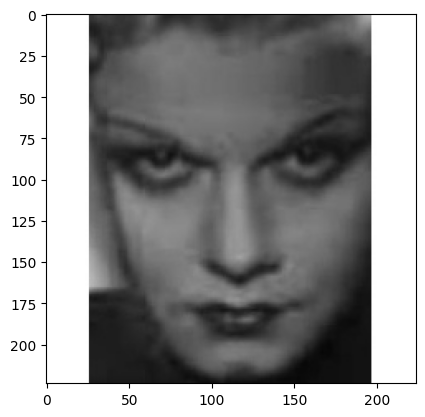



--------------------------------------------------
Correct label = 40.0
Predicted label = 23.12741470336914
Error = 16.87258529663086
--------------------------------------------------


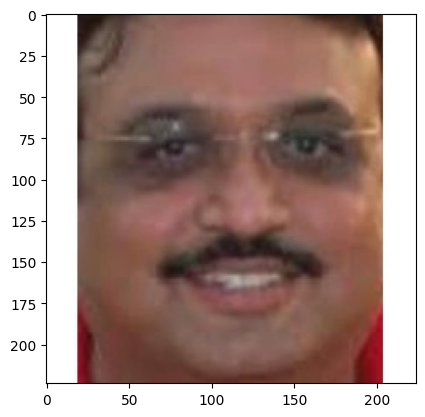



--------------------------------------------------
Correct label = 56.0
Predicted label = 39.184993743896484
Error = 16.815006256103516
--------------------------------------------------


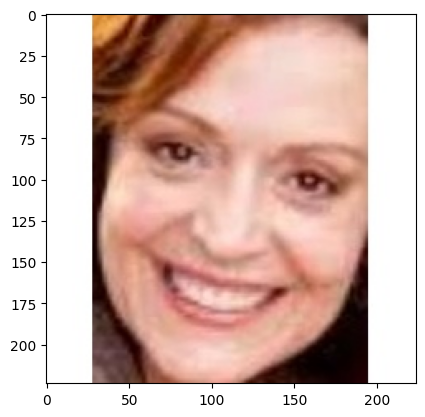



--------------------------------------------------
Correct label = 39.0
Predicted label = 55.809532165527344
Error = 16.809532165527344
--------------------------------------------------


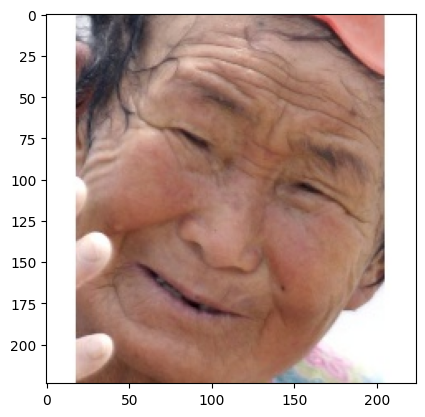



--------------------------------------------------
Correct label = 85.0
Predicted label = 68.21892547607422
Error = 16.78107452392578
--------------------------------------------------


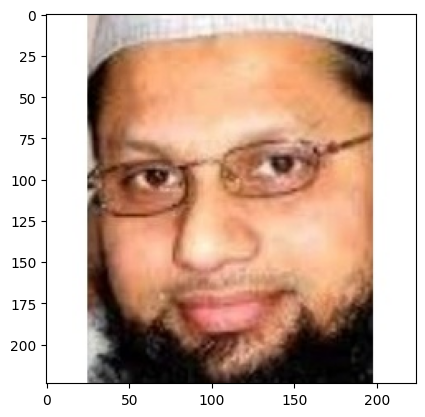



--------------------------------------------------
Correct label = 26.0
Predicted label = 42.76591873168945
Error = 16.765918731689453
--------------------------------------------------


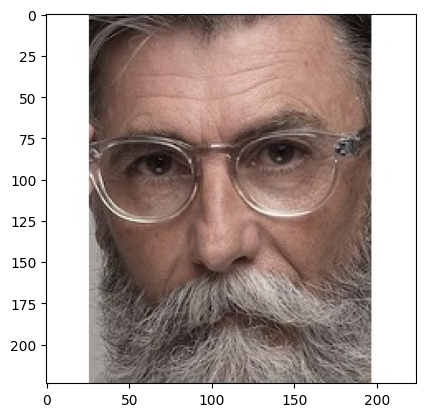



--------------------------------------------------
Correct label = 60.0
Predicted label = 76.63977813720703
Error = 16.63977813720703
--------------------------------------------------


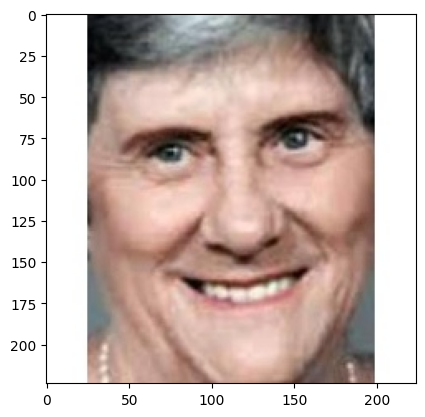



--------------------------------------------------
Correct label = 70.0
Predicted label = 53.4849739074707
Error = 16.515026092529297
--------------------------------------------------


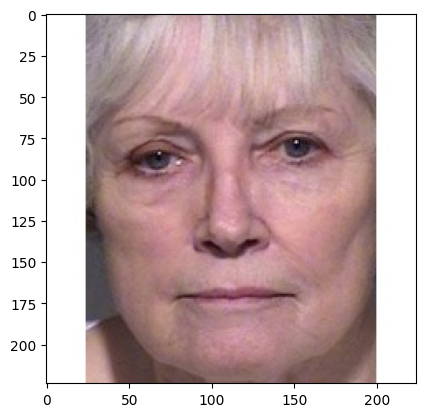



--------------------------------------------------
Correct label = 62.0
Predicted label = 78.49708557128906
Error = 16.497085571289062
--------------------------------------------------


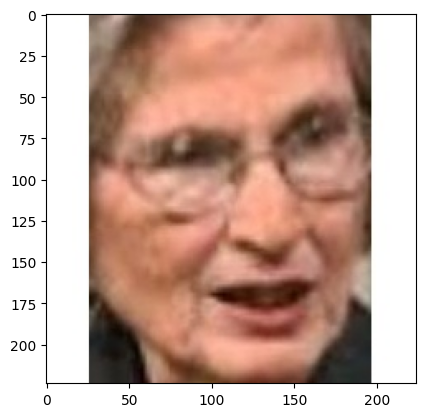



--------------------------------------------------
Correct label = 60.0
Predicted label = 76.45510864257812
Error = 16.455108642578125
--------------------------------------------------


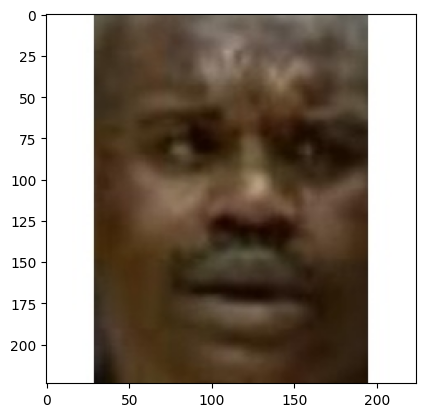



--------------------------------------------------
Correct label = 27.0
Predicted label = 43.43571472167969
Error = 16.435714721679688
--------------------------------------------------


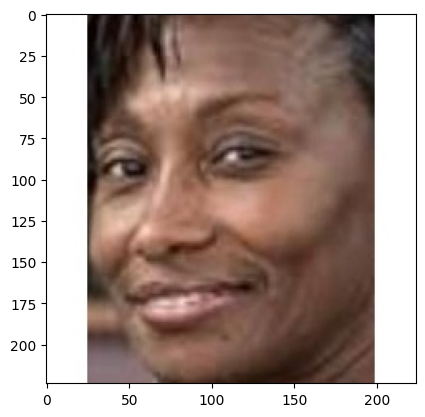



--------------------------------------------------
Correct label = 53.0
Predicted label = 36.57988357543945
Error = 16.420116424560547
--------------------------------------------------


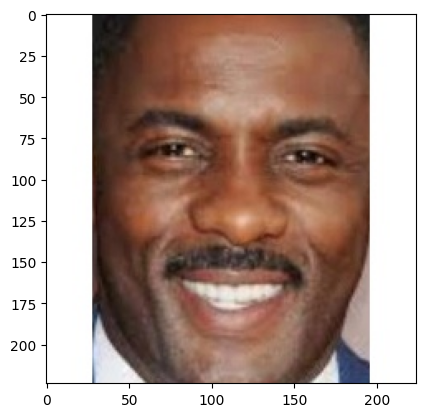



--------------------------------------------------
Correct label = 61.0
Predicted label = 44.61460876464844
Error = 16.385391235351562
--------------------------------------------------


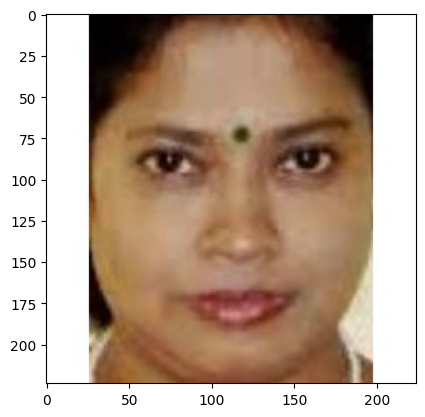



--------------------------------------------------
Correct label = 45.0
Predicted label = 28.636140823364258
Error = 16.363859176635742
--------------------------------------------------


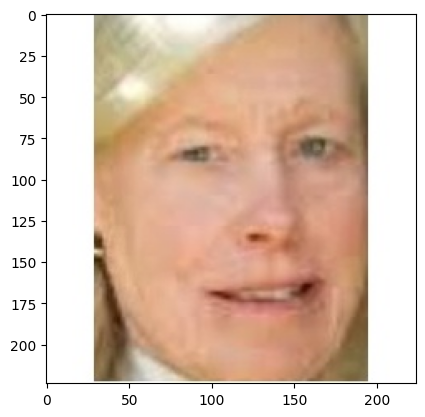



--------------------------------------------------
Correct label = 52.0
Predicted label = 68.3370590209961
Error = 16.337059020996094
--------------------------------------------------


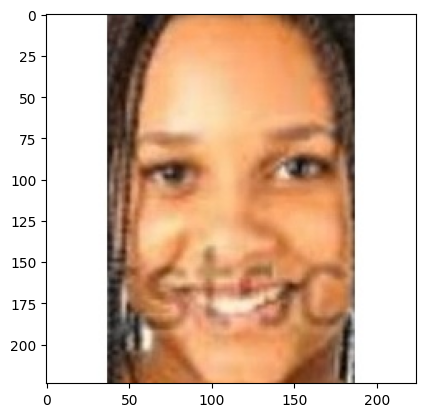



--------------------------------------------------
Correct label = 12.0
Predicted label = 28.332921981811523
Error = 16.332921981811523
--------------------------------------------------


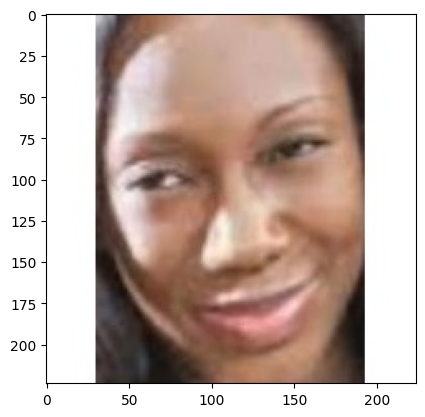



--------------------------------------------------
Correct label = 46.0
Predicted label = 29.672304153442383
Error = 16.327695846557617
--------------------------------------------------


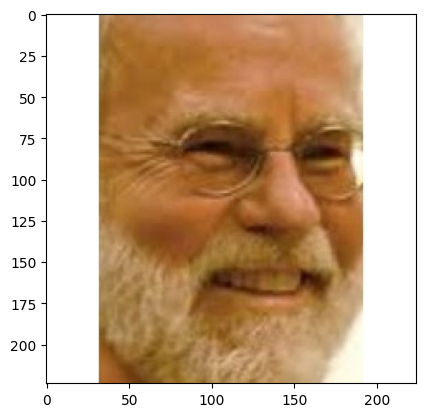



--------------------------------------------------
Correct label = 61.0
Predicted label = 77.30757141113281
Error = 16.307571411132812
--------------------------------------------------


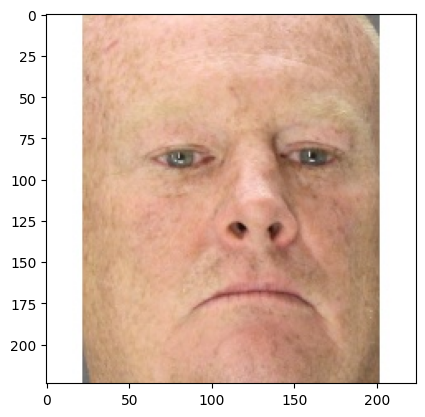



--------------------------------------------------
Correct label = 52.0
Predicted label = 68.27457427978516
Error = 16.274574279785156
--------------------------------------------------


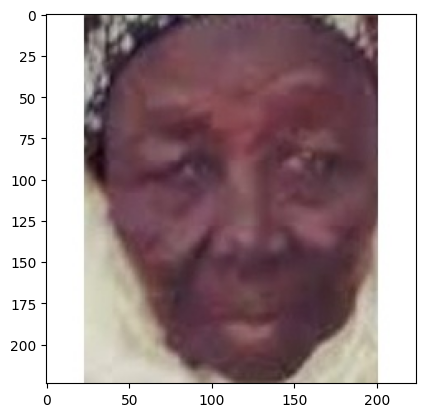



--------------------------------------------------
Correct label = 70.0
Predicted label = 86.24950408935547
Error = 16.24950408935547
--------------------------------------------------


In [36]:
# Plot worst predictions for test dataset
for ex in highest_error_idx_test[:n_worst]:
    plt.imshow(X_test[ex].astype(np.uint8))
    plt.show()
    correct_label = age_predictions_test[ex][0]
    predicted_label = age_predictions_test[ex][1]
    error = age_predictions_test[ex][2]
    print('\n')
    print('-'*50)
    print('Correct label =', correct_label)
    print('Predicted label =', predicted_label)
    print('Error =', error)
    print('-'*50)